# 03 - 検索結果の可視化

自然言語クエリで画像を検索し、結果を視覚的に確認する。

## 入力
- `data/images.duckdb` (image_catalog + image_embeddings テーブル)

In [1]:
from pathlib import Path

import duckdb
import matplotlib.pyplot as plt
from PIL import Image

from image_vector_poc import SigLIPEmbedder

## 設定

In [2]:
# DuckDBファイルのパス
DB_PATH = Path("../data/images.duckdb")

# 表示設定
TOP_K = 10  # 取得件数
COLS = 5    # 列数

## 初期化

In [3]:
# モデル読み込み
print("SigLIPモデルを読み込み中...")
embedder = SigLIPEmbedder(device="cuda")
embedding_dim = embedder.embedding_dim
print(f"モデル読み込み完了: {embedder.model_name}")

SigLIPモデルを読み込み中...


Loading weights:   0%|          | 0/408 [00:00<?, ?it/s]

The image processor of type `SiglipImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


モデル読み込み完了: google/siglip-base-patch16-224


In [4]:
# データベース接続
conn = duckdb.connect(str(DB_PATH), read_only=True)
conn.execute("LOAD vss;")

# データ件数確認
count = conn.execute("SELECT COUNT(*) FROM image_embeddings").fetchone()[0]
print(f"検索対象画像数: {count}")

検索対象画像数: 1134


## 検索・表示関数

In [5]:
def search_images(query: str, k: int = 10) -> list[dict]:
    """テキストクエリで画像を検索"""
    query_embedding = embedder.embed_text(query)
    
    results = conn.execute(f"""
        SELECT 
            e.id,
            c.file_path,
            c.file_name,
            c.category,
            1.0 - array_cosine_distance(e.embedding, ?::FLOAT[{embedding_dim}]) as score
        FROM image_embeddings e
        JOIN image_catalog c ON e.id = c.id
        ORDER BY array_cosine_distance(e.embedding, ?::FLOAT[{embedding_dim}])
        LIMIT ?
    """, [query_embedding.tolist(), query_embedding.tolist(), k]).fetchall()
    
    return [
        {
            "id": r[0],
            "file_path": r[1],
            "file_name": r[2],
            "category": r[3],
            "score": r[4],
        }
        for r in results
    ]

In [6]:
def show_results(query: str, results: list[dict], cols: int = 5):
    """検索結果をグリッド表示"""
    n = len(results)
    rows = (n + cols - 1) // cols
    
    fig, axes = plt.subplots(rows, cols, figsize=(3 * cols, 3.5 * rows))
    fig.suptitle(f'Query: "{query}"', fontsize=14, fontweight='bold')
    
    # axesを1次元配列に変換
    if rows == 1:
        axes = [axes] if cols == 1 else list(axes)
    else:
        axes = [ax for row in axes for ax in row]
    
    for i, ax in enumerate(axes):
        if i < n:
            result = results[i]
            try:
                img = Image.open(result["file_path"])
                img.thumbnail((300, 300))
                ax.imshow(img)
                ax.set_title(f"{result['score']:.3f}\n{result['category']}", fontsize=9)
            except Exception as e:
                ax.text(0.5, 0.5, f"Error\n{e}", ha='center', va='center')
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

In [7]:
def search_and_show(query: str, k: int = TOP_K, cols: int = COLS):
    """検索して結果を表示"""
    results = search_images(query, k)
    show_results(query, results, cols)
    return results

## 検索テスト

In [8]:
# テスト用クエリリスト
queries = [
    "青い空",
    "猫",
    "食べ物",
    "夕焼け",
    "人物",
    "海",
    "山",
    "花",
]


クエリ: 青い空


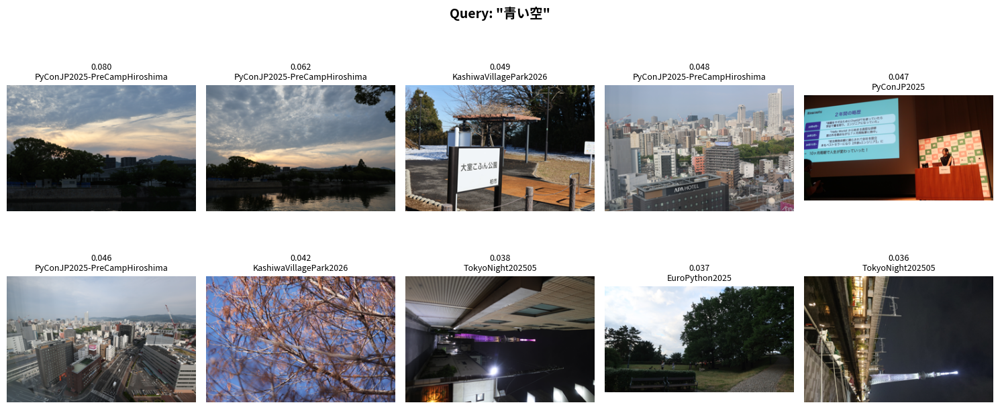


クエリ: 猫


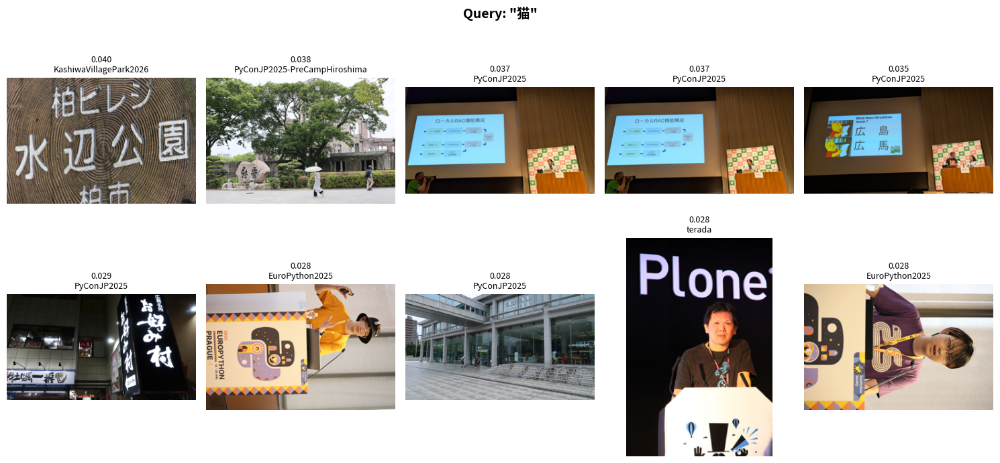


クエリ: 食べ物


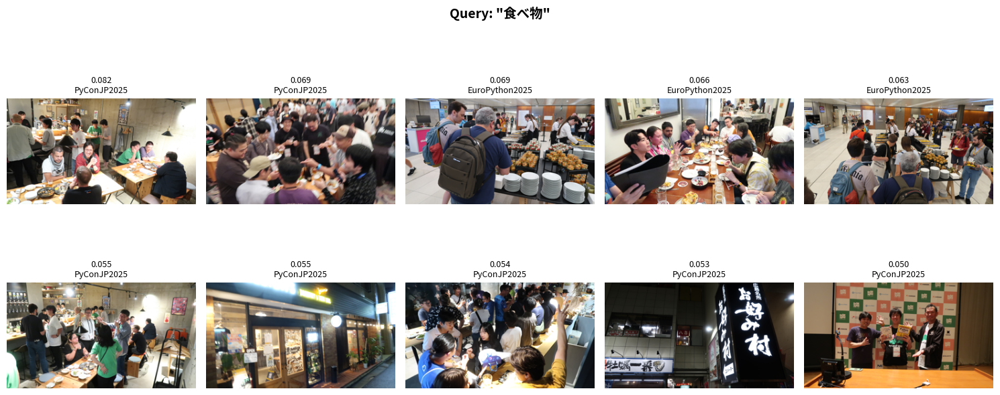


クエリ: 夕焼け


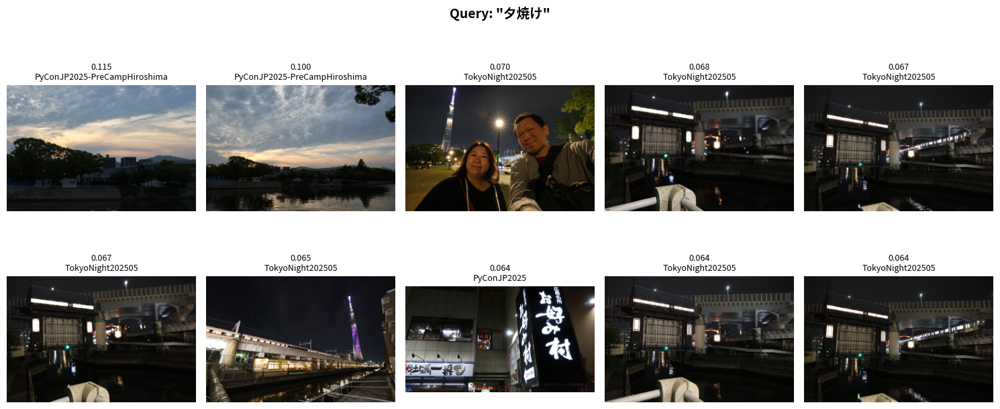


クエリ: 人物


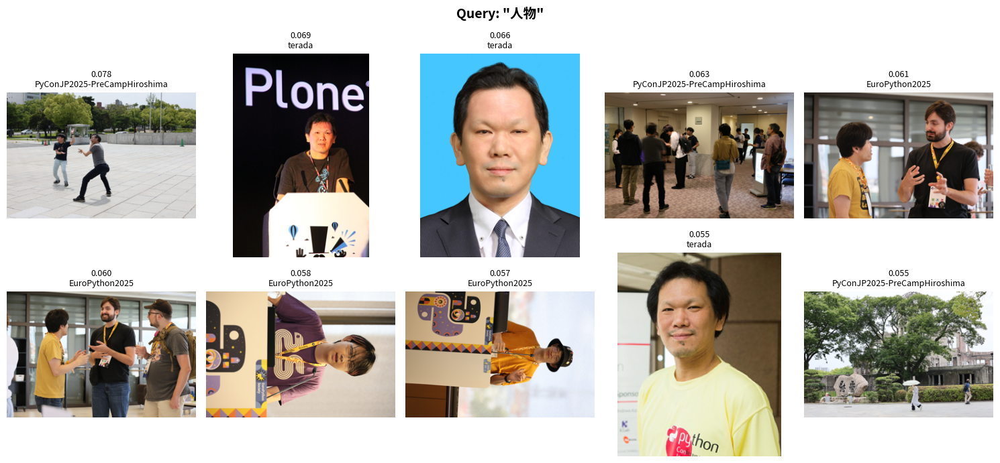


クエリ: 海


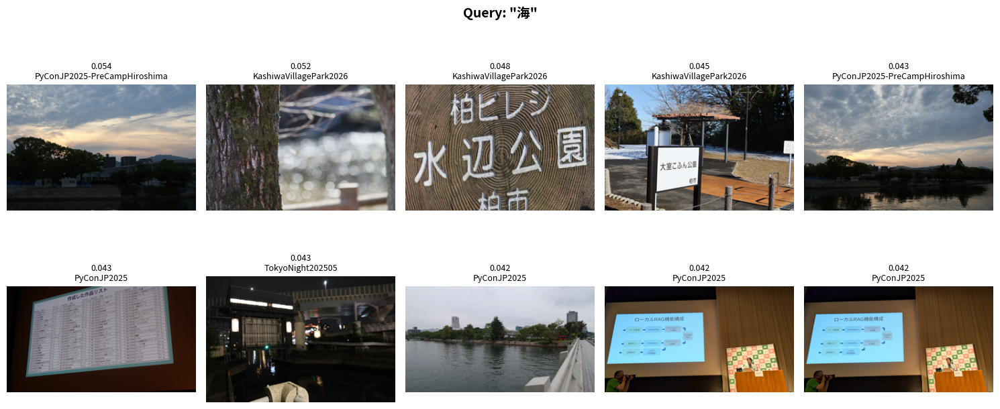


クエリ: 山


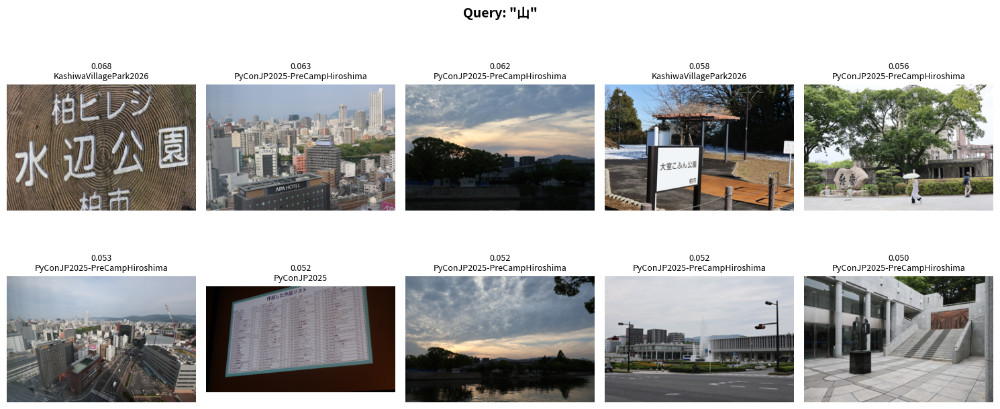


クエリ: 花


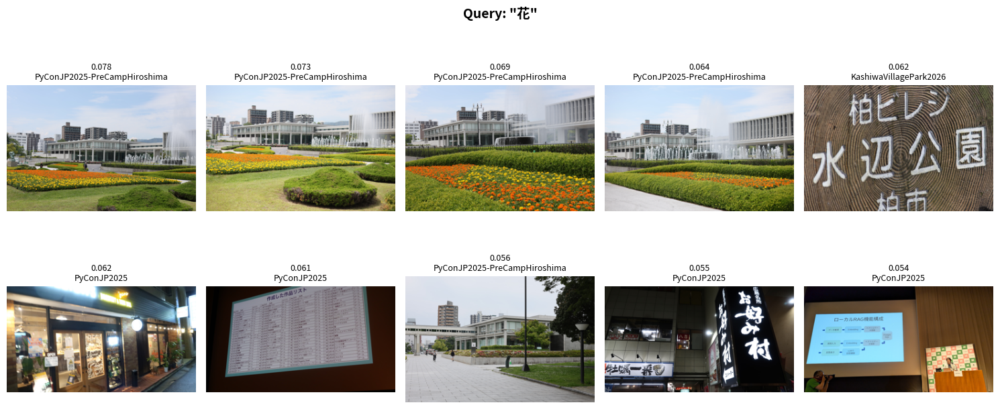

In [9]:
# 各クエリで検索を実行
for query in queries:
    print(f"\n{'='*50}")
    print(f"クエリ: {query}")
    print(f"{'='*50}")
    search_and_show(query, k=TOP_K, cols=COLS)

## カスタム検索

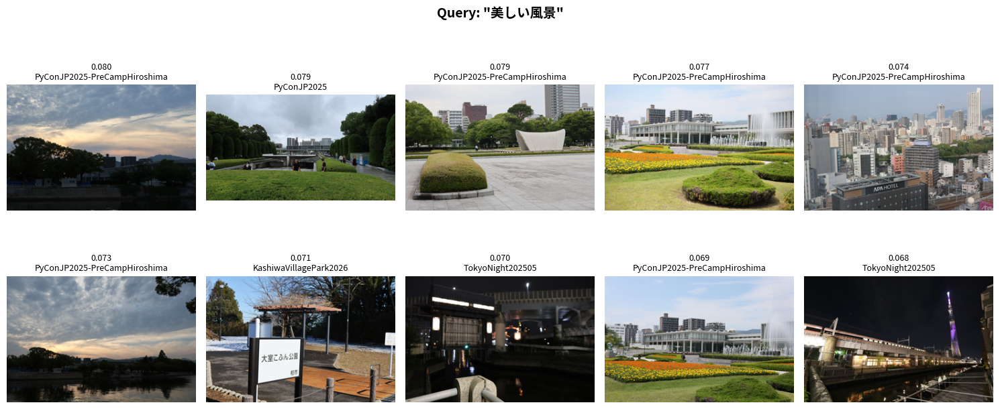

[{'id': '42ef7001-2ed7-43ec-b717-4386b27fe073',
  'file_path': '/mnt/hdd/data/images/PyConJP2025-PreCampHiroshima/2025-06-07 19.53.24.jpg',
  'file_name': '2025-06-07 19.53.24.jpg',
  'category': 'PyConJP2025-PreCampHiroshima',
  'score': 0.08006536960601807},
 {'id': '44cede7e-4e76-4570-9b24-e5d2cd53dbf3',
  'file_path': '/mnt/hdd/data/images/PyConJP2025/Day0/2025-09-25 12.46.44.jpg',
  'file_name': '2025-09-25 12.46.44.jpg',
  'category': 'PyConJP2025',
  'score': 0.07871532440185547},
 {'id': '617f910f-ccc6-422a-961c-4d0567e5f10d',
  'file_path': '/mnt/hdd/data/images/PyConJP2025-PreCampHiroshima/2025-06-07 09.54.42.jpg',
  'file_name': '2025-06-07 09.54.42.jpg',
  'category': 'PyConJP2025-PreCampHiroshima',
  'score': 0.07850682735443115},
 {'id': '896e396d-2bf5-49eb-94a2-547ccf57123b',
  'file_path': '/mnt/hdd/data/images/PyConJP2025-PreCampHiroshima/2025-06-07 14.52.11.jpg',
  'file_name': '2025-06-07 14.52.11.jpg',
  'category': 'PyConJP2025-PreCampHiroshima',
  'score': 0.07651

In [10]:
# カスタムクエリで検索
custom_query = "美しい風景"
search_and_show(custom_query, k=10, cols=5)

## カテゴリ別統計

In [11]:
# カテゴリ別の画像数
categories = conn.execute("""
    SELECT c.category, COUNT(*) as count
    FROM image_catalog c
    JOIN image_embeddings e ON c.id = e.id
    GROUP BY c.category
    ORDER BY count DESC
""").fetchall()

print("カテゴリ別画像数（ベクトル化済み）:")
for cat, count in categories:
    print(f"  {cat}: {count}")

カテゴリ別画像数（ベクトル化済み）:
  EuroPython2025: 129
  PyConJP2025: 77
  PyConJP2025-PreCampHiroshima: 57
  KashiwaVillagePark2026: 56
  TokyoNight202505: 49
  terada: 10


In [12]:
# 接続を閉じる
conn.close()
print("完了")

完了
